# Higgs Boson Event Detection

# <span style="font-family:cursive;text-align:center">⬇️ Importing Libraries</span>

In [121]:
import time, os

# Progress bar for loops
# !pip install tqdm
from tqdm import tqdm

# Mathematical functions
import math

# Data manipulation
import numpy as np
import pandas as pd

# Plotting and visualization
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import get_test_data

import seaborn as sns
sns.set_theme()
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation

from keras.models import Model
from keras import layers
import kerastuner as kt
from keras import Input
from sklearn.metrics import precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler 

import tensorflow as tf
from tensorflow import keras

C:\Users\santh\AppData\Local\Temp\ipykernel_17704\1215019357.py:34: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


In [4]:
df = pd.read_csv("C:/Users/santh/Downloads/Dataset and Research Papers/Dataset/training.csv")
df.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,...,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.002653,s
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,...,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226,2.233584,b
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,...,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251,2.347389,b
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,5.446378,b
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,6.245333,b


# <span style="font-family:cursive;text-align:center">📊 Exploratory Data Analysis</span>

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 33 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   EventId                      250000 non-null  int64  
 1   DER_mass_MMC                 250000 non-null  float64
 2   DER_mass_transverse_met_lep  250000 non-null  float64
 3   DER_mass_vis                 250000 non-null  float64
 4   DER_pt_h                     250000 non-null  float64
 5   DER_deltaeta_jet_jet         250000 non-null  float64
 6   DER_mass_jet_jet             250000 non-null  float64
 7   DER_prodeta_jet_jet          250000 non-null  float64
 8   DER_deltar_tau_lep           250000 non-null  float64
 9   DER_pt_tot                   250000 non-null  float64
 10  DER_sum_pt                   250000 non-null  float64
 11  DER_pt_ratio_lep_tau         250000 non-null  float64
 12  DER_met_phi_centrality       250000 non-null  float64
 13 

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
EventId,250000.0,224999.500000,72168.927986,100000.000000,162499.750000,224999.500000,287499.250000,349999.000000
DER_mass_MMC,250000.0,-49.023079,406.345647,-999.000000,78.100750,105.012000,130.606250,1192.026000
DER_mass_transverse_met_lep,250000.0,49.239819,35.344886,0.000000,19.241000,46.524000,73.598000,690.075000
DER_mass_vis,250000.0,81.181982,40.828691,6.329000,59.388750,73.752000,92.259000,1349.351000
DER_pt_h,250000.0,57.895962,63.655682,0.000000,14.068750,38.467500,79.169000,2834.999000
DER_deltaeta_jet_jet,250000.0,-708.420675,454.480565,-999.000000,-999.000000,-999.000000,0.490000,8.503000
DER_mass_jet_jet,250000.0,-601.237051,657.972302,-999.000000,-999.000000,-999.000000,83.446000,4974.979000
DER_prodeta_jet_jet,250000.0,-709.356603,453.019877,-999.000000,-999.000000,-999.000000,-4.593000,16.690000
DER_deltar_tau_lep,250000.0,2.373100,0.782911,0.208000,1.810000,2.491500,2.961000,5.684000
DER_pt_tot,250000.0,18.917332,22.273494,0.000000,2.841000,12.315500,27.591000,2834.999000


In [9]:
df.columns

Index(['EventId', 'DER_mass_MMC', 'DER_mass_transverse_met_lep',
       'DER_mass_vis', 'DER_pt_h', 'DER_deltaeta_jet_jet', 'DER_mass_jet_jet',
       'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
       'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
       'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt',
       'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_subleading_pt',
       'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt',
       'Weight', 'Label'],
      dtype='object')

In [10]:
df.dtypes

EventId                          int64
DER_mass_MMC                   float64
DER_mass_transverse_met_lep    float64
DER_mass_vis                   float64
DER_pt_h                       float64
DER_deltaeta_jet_jet           float64
DER_mass_jet_jet               float64
DER_prodeta_jet_jet            float64
DER_deltar_tau_lep             float64
DER_pt_tot                     float64
DER_sum_pt                     float64
DER_pt_ratio_lep_tau           float64
DER_met_phi_centrality         float64
DER_lep_eta_centrality         float64
PRI_tau_pt                     float64
PRI_tau_eta                    float64
PRI_tau_phi                    float64
PRI_lep_pt                     float64
PRI_lep_eta                    float64
PRI_lep_phi                    float64
PRI_met                        float64
PRI_met_phi                    float64
PRI_met_sumet                  float64
PRI_jet_num                      int64
PRI_jet_leading_pt             float64
PRI_jet_leading_eta      

In [12]:
# Count of column datatypes for the training dataset
df_cols = pd.DataFrame(index = ['Number of columns for the Dataset'], columns = ['Integer', 'Float', 'Object'])
df_cols['Integer'] = len(df.columns[df.dtypes == 'int64'])
df_cols['Float'] = len(df.columns[df.dtypes == 'float64'])
df_cols['Object'] = len(df.columns[df.dtypes == 'object'])
df_cols

,Integer,Float,Object
Number of columns for the Dataset,2,30,1


In [15]:
#Checking Duplicates :

print(df.duplicated().sum())

0


In [16]:
# Checking for missing values

# Function to calculate missing values and the columns :

def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [17]:
missing_values_table(df)

Your selected dataframe has 33 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [ ]:
#Removing Unwanted Columns:

df = df.drop('EventId',axis=1)

In [28]:
print(f'Train Dataset contains {df.shape[0]} rows and {df.shape[1]} columns')

Train Dataset contains 250000 rows and 32 columns


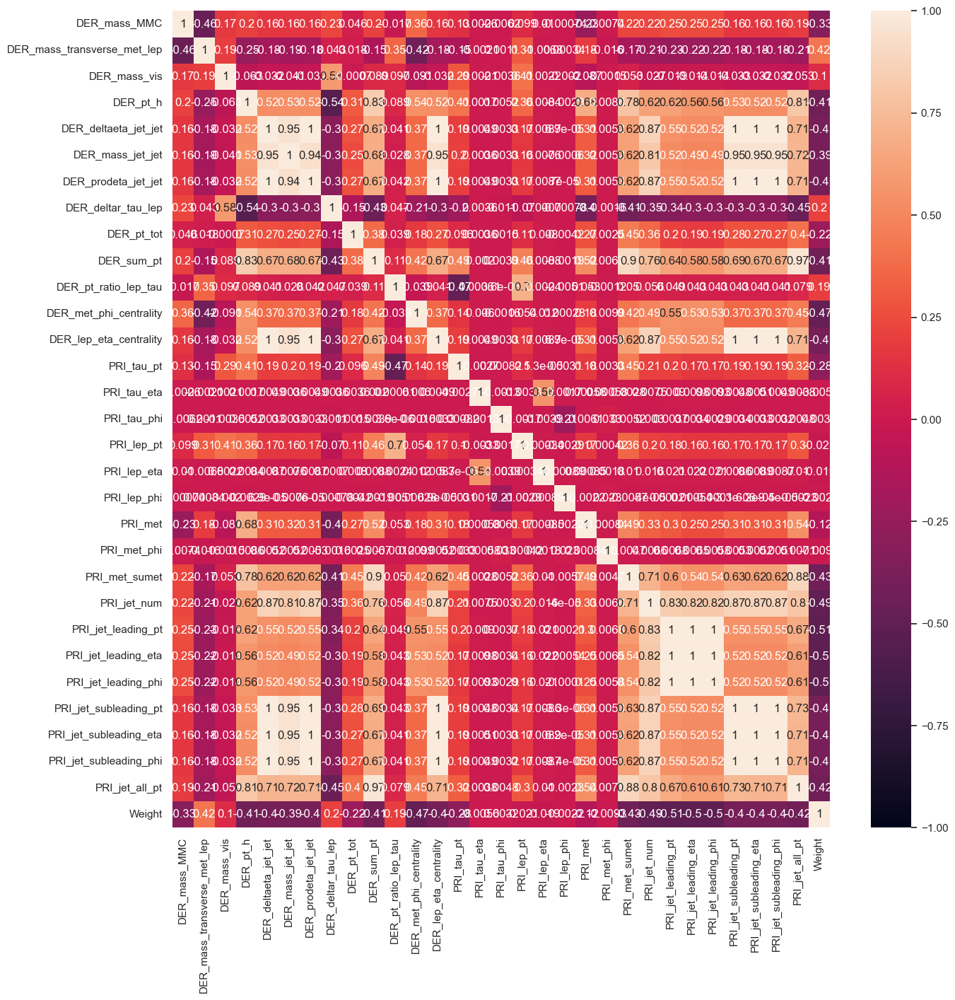

In [23]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=+1)
plt.show()

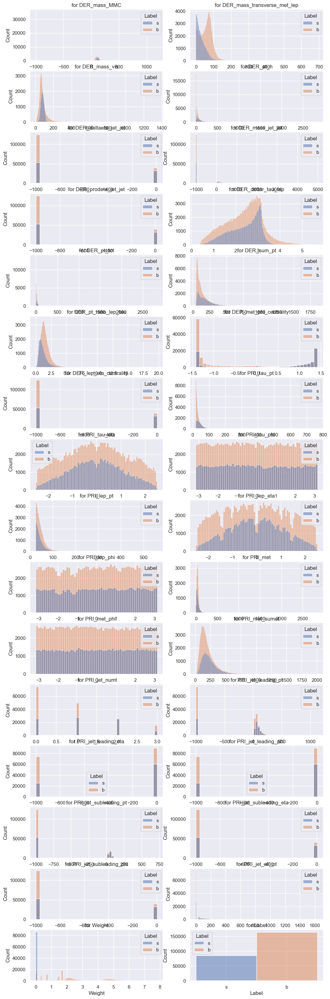

In [25]:
# box plot per categorical variable
plt.figure(figsize=(12,40))
for i,col in enumerate(df.columns.to_list()):
    plt.subplot(16,2,i+1)
    sns.histplot(x=col, hue='Label',data=df)
    plt.title(f"for {col}")
plt.show()

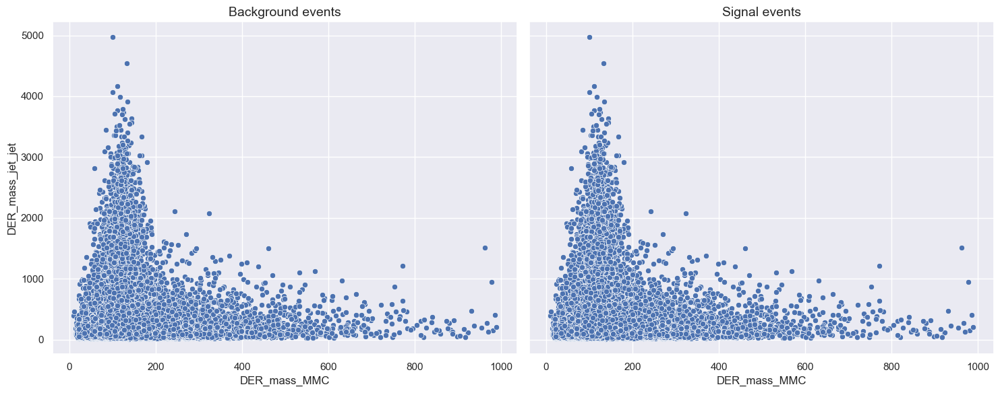

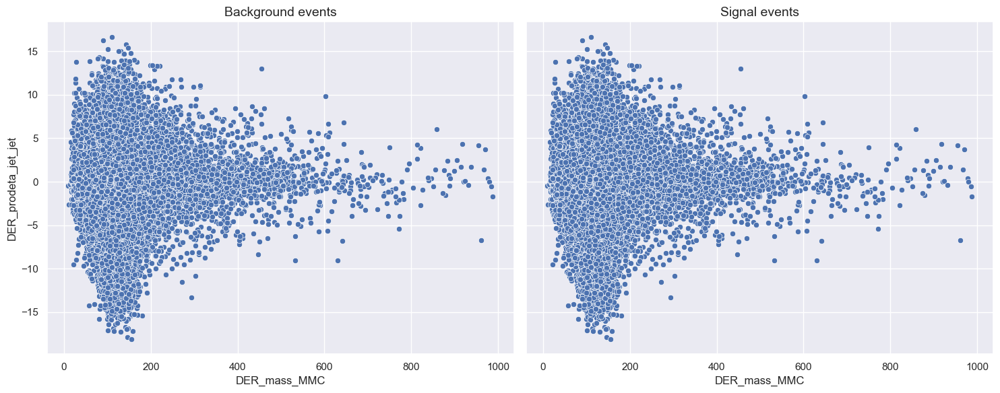

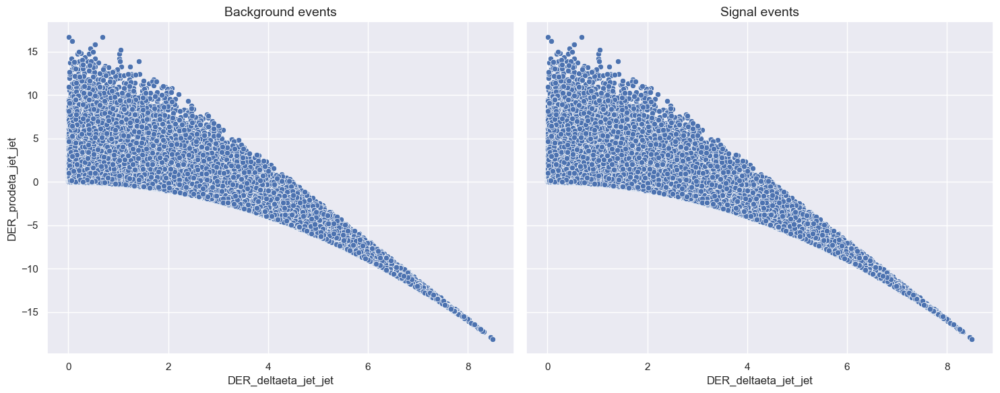

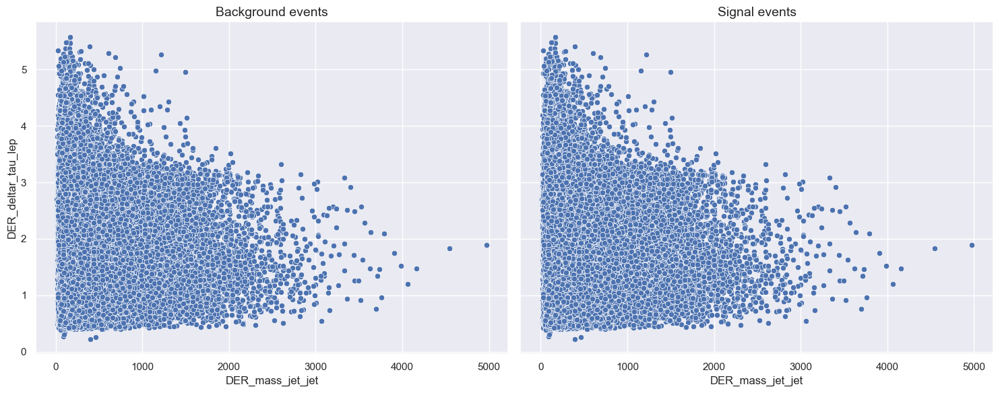

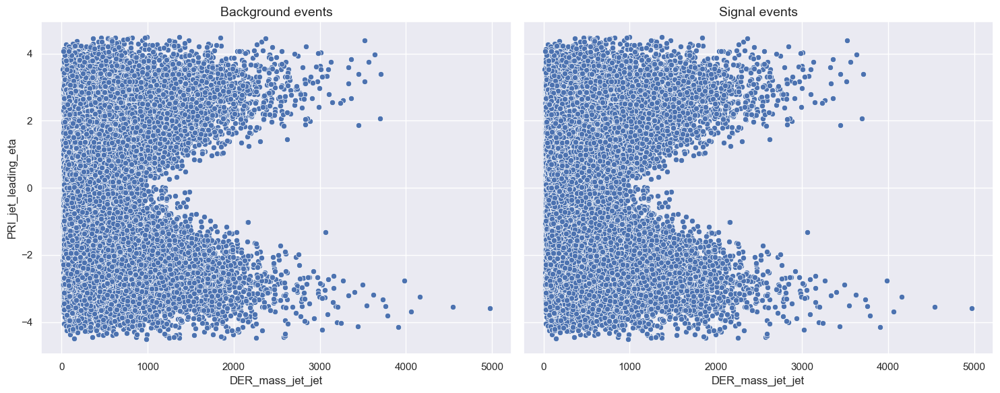

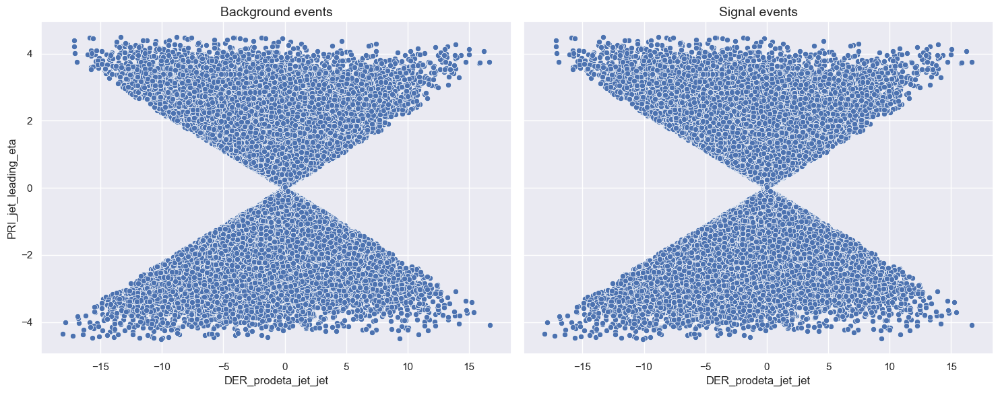

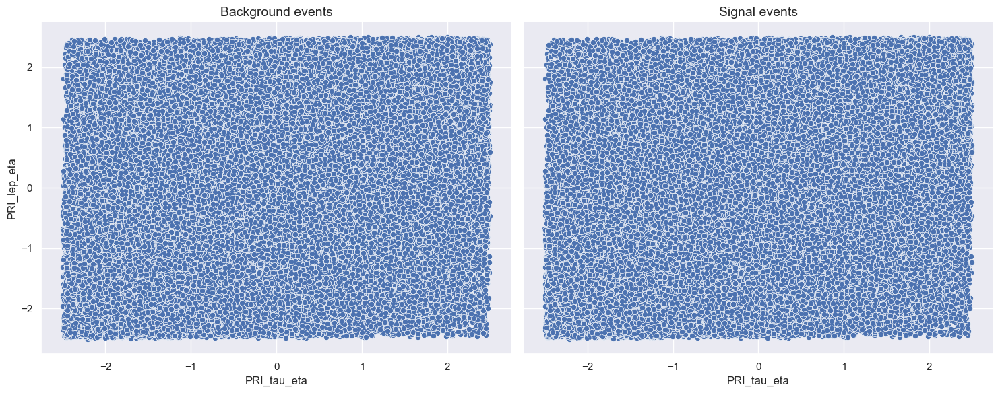

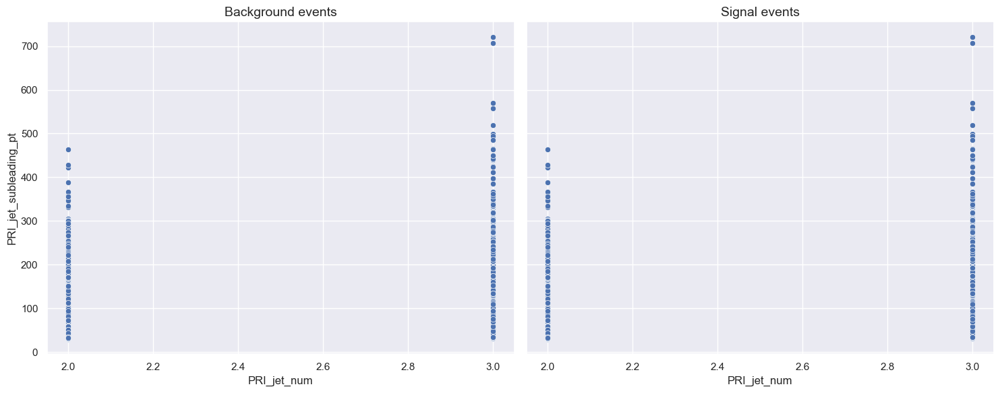

In [29]:
# Selected bivariate scatterplots
pairs_selected = [
    ('DER_mass_MMC', 'DER_mass_jet_jet'),
    ('DER_mass_MMC', 'DER_prodeta_jet_jet'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet'),
    ('DER_mass_jet_jet', 'DER_deltar_tau_lep'),
    ('DER_mass_jet_jet', 'PRI_jet_leading_eta'),
    ('DER_prodeta_jet_jet', 'PRI_jet_leading_eta'),
    ('PRI_tau_eta', 'PRI_lep_eta'),
    ('PRI_jet_num', 'PRI_jet_subleading_pt')
]
for z in pairs_selected:
    fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
    sns.scatterplot(data = df.replace(-999, np.nan), x = z[0], y = z[1], ax = ax[0])
    sns.scatterplot(data = df.replace(-999, np.nan), x = z[0], y = z[1], ax = ax[1])
    ax[0].set_title("Background events", fontsize = 14)
    ax[1].set_title("Signal events", fontsize = 14)
    plt.tight_layout()
plt.show()

C:\Users\santh\AppData\Local\Temp\ipykernel_17704\2340958916.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (15, 9))


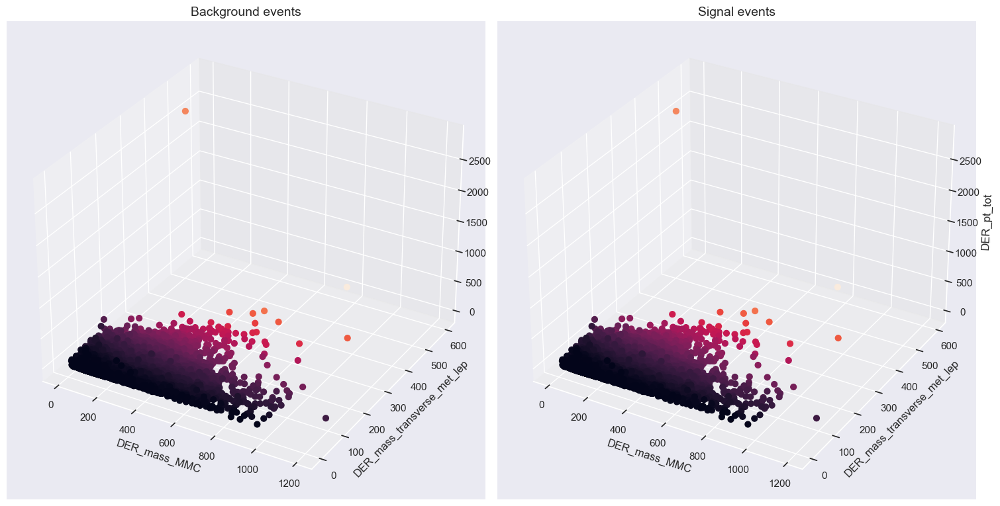

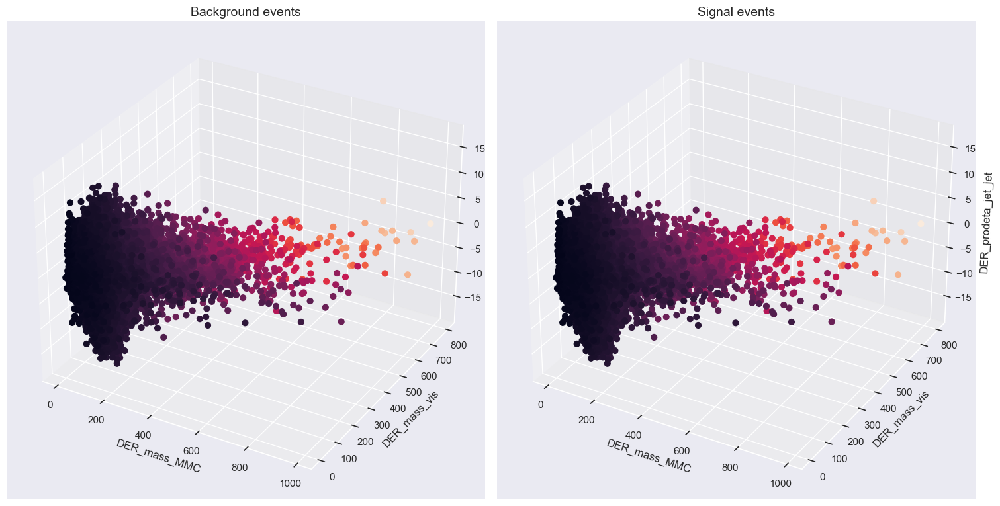

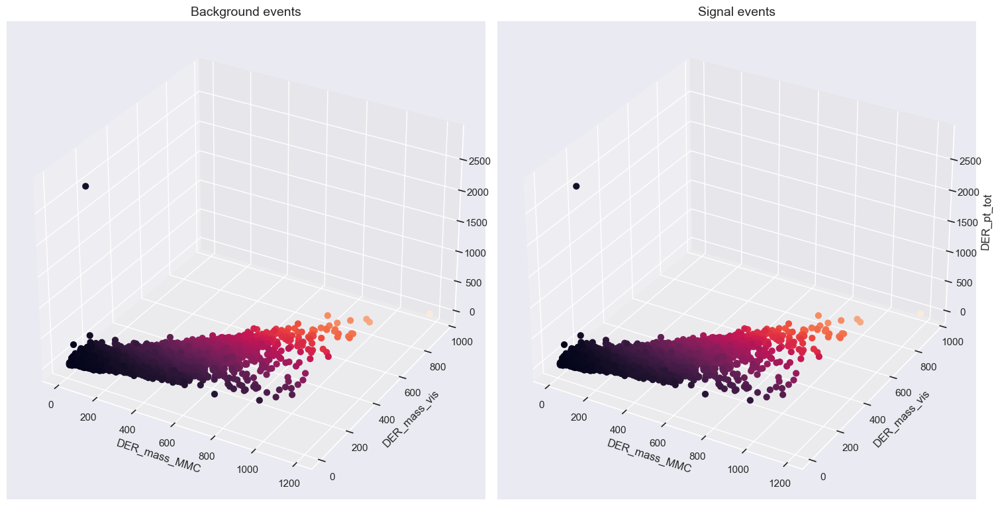

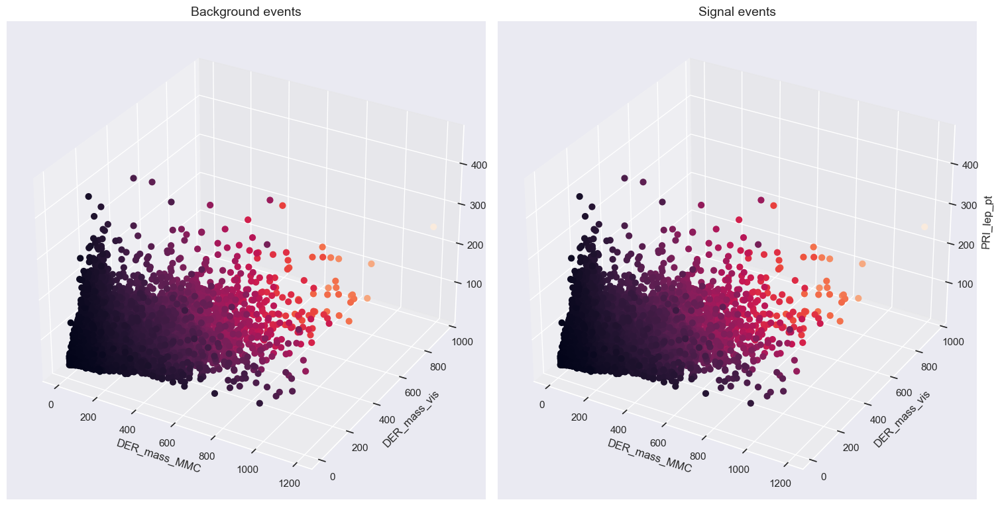

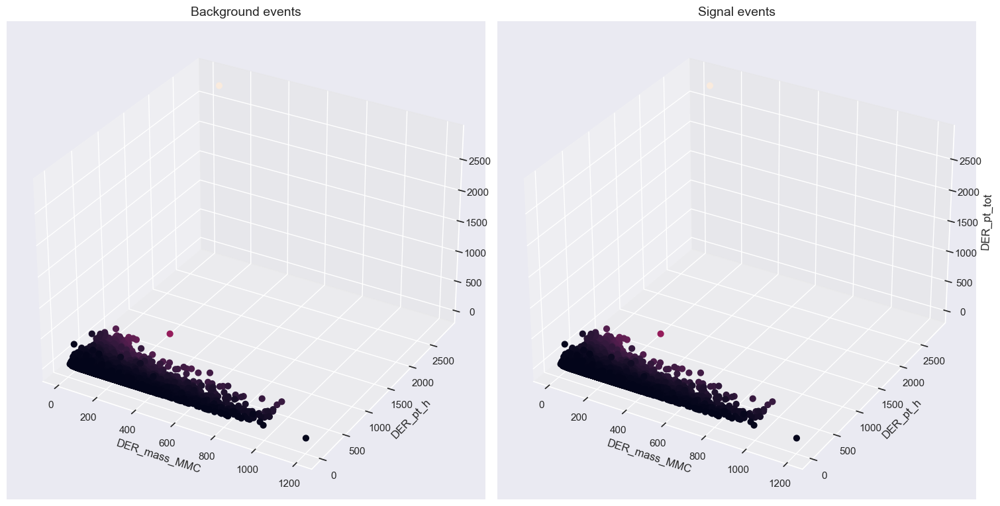

...

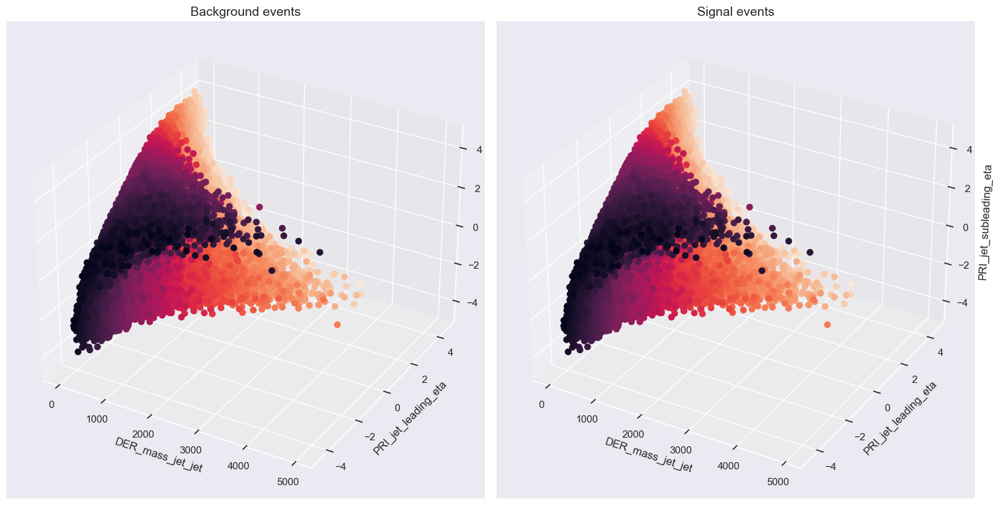

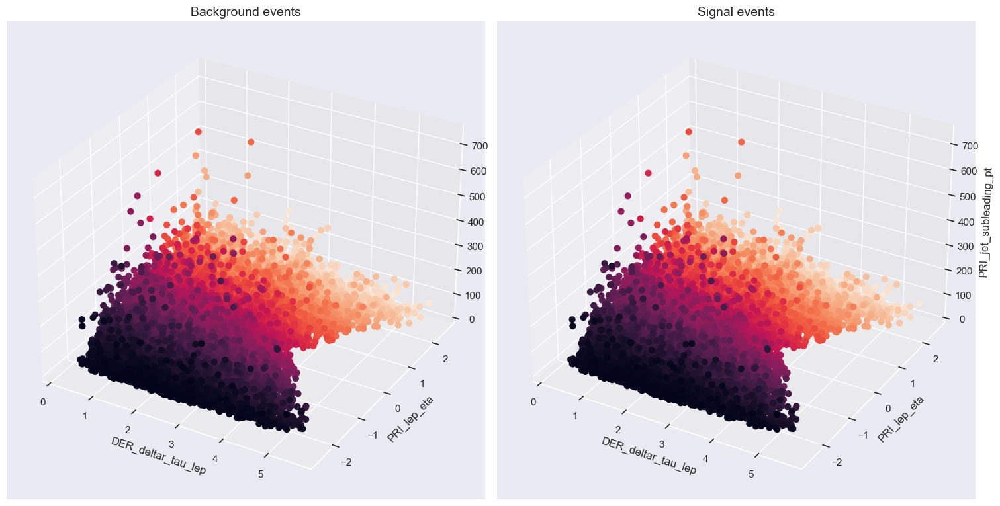

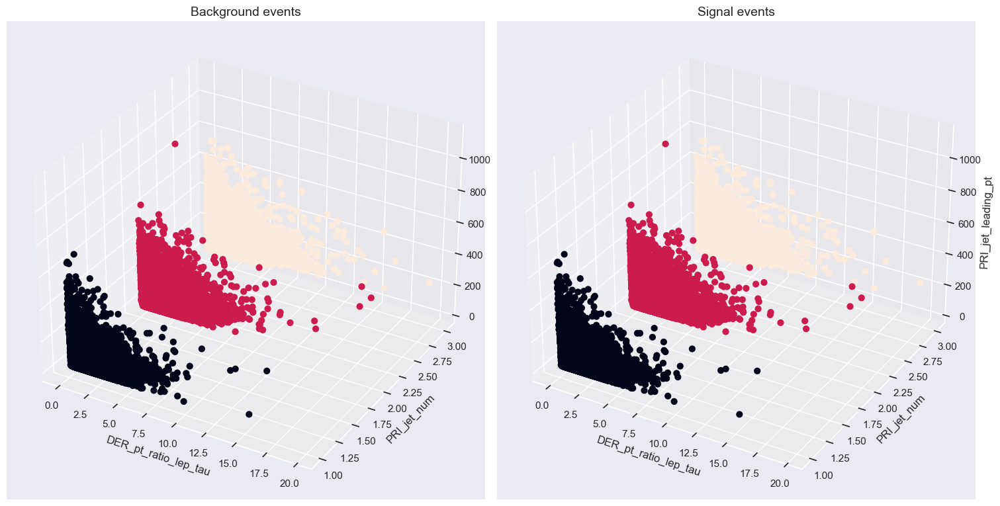

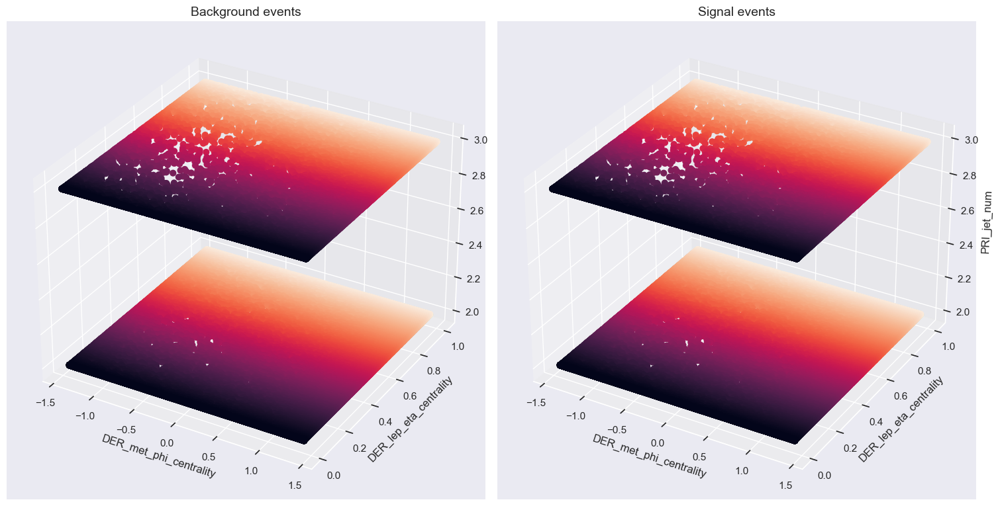

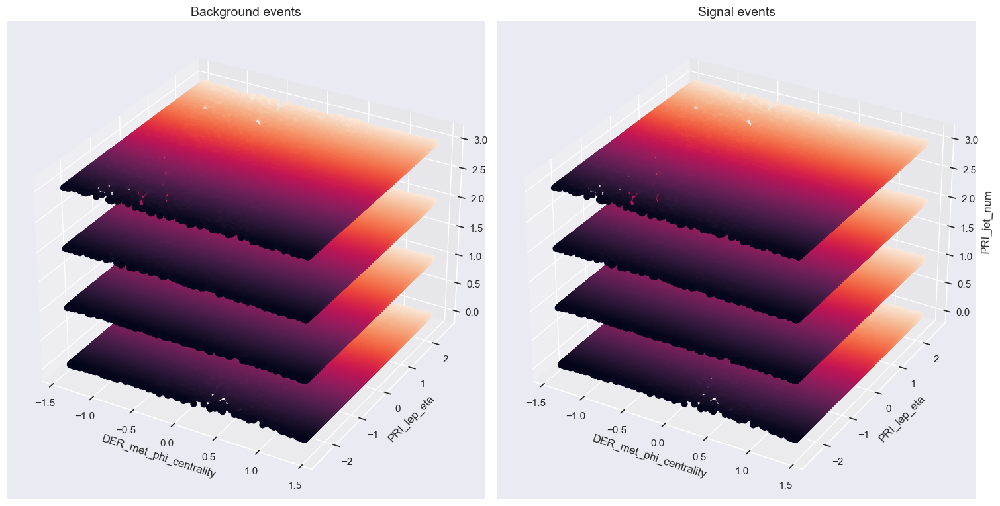

In [31]:
# Selected trivariate scatterplots
triples_selected = [
    ('DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_prodeta_jet_jet'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'PRI_lep_pt'),
    ('DER_mass_MMC', 'DER_pt_h', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_pt_h', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'DER_deltaeta_jet_jet', 'PRI_jet_num'),
    ('DER_mass_MMC', 'DER_mass_jet_jet', 'PRI_jet_subleading_eta'),
    ('DER_mass_MMC', 'DER_prodeta_jet_jet', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_met'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_mass_MMC', 'PRI_met_phi', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_mass_vis', 'DER_pt_h', 'PRI_jet_leading_pt'),
    ('DER_pt_h', 'PRI_jet_num', 'PRI_jet_leading_eta'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_eta'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_phi'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_all_pt'),
    ('DER_deltaeta_jet_jet', 'DER_met_phi_centrality', 'PRI_jet_num'),
    ('DER_mass_jet_jet', 'DER_deltar_tau_lep', 'PRI_lep_pt'),
    ('DER_mass_jet_jet', 'PRI_tau_pt', 'PRI_jet_subleading_eta'),
    ('DER_prodeta_jet_jet', 'DER_sum_pt', 'PRI_jet_all_pt'),
    ('DER_mass_jet_jet', 'PRI_jet_leading_eta', 'PRI_jet_subleading_eta'),
    ('DER_deltar_tau_lep', 'PRI_lep_eta', 'PRI_jet_subleading_pt'),
    ('DER_pt_ratio_lep_tau', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_met_phi_centrality', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_met_phi_centrality', 'PRI_lep_eta', 'PRI_jet_num')
]
for z in triples_selected:
    fig = plt.figure(figsize = (15, 9))
    ax = fig.add_subplot(1, 2, 1, projection = '3d')
    x_b = df.replace(-999, np.nan)[z[0]]
    y_b = df.replace(-999, np.nan)[z[1]]
    z_b = df.replace(-999, np.nan)[z[2]]
    s1 = ax.scatter(x_b, y_b, z_b, s = 40, marker = 'o', c = y_b, alpha = 1)
    ax.set_title("Background events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1]) # ax.set_zlabel(z[2])
    ax = fig.add_subplot(1, 2, 2, projection = '3d')
    x_s = df.replace(-999, np.nan)[z[0]]
    y_s = df.replace(-999, np.nan)[z[1]]
    z_s = df.replace(-999, np.nan)[z[2]]
    s2 = ax.scatter(x_s, y_s, z_s, s = 40, marker = 'o', c = y_s, alpha = 1)
    ax.set_title("Signal events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1])
    ax.set_zlabel(z[2])
    plt.tight_layout()
plt.show()

b    164333
s     85667
Name: Label, dtype: int64

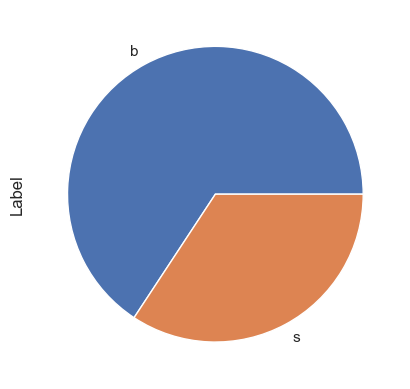

In [39]:
#Distribution of Target Variable :

fig, ax = plt.subplots()
df['Label'].value_counts().plot(kind='pie', ax=ax)
df['Label'].value_counts()

# <span style="font-family:cursive;text-align:center">🧰 Modelling :</span>

In [90]:
#train and test split & standardizing the data
def train_test_func(df):
    # train and test split
    X = df.drop('Label', axis=1)
    y = df['Label']
    X_trn, X_tst, y_trn, y_tst = train_test_split(X, y, train_size=0.75, random_state=42)

    # scale the dataset
    sc = StandardScaler()
    X_train = sc.fit_transform(X_trn)
    X_test = sc.transform(X_tst)
    X_train = pd.DataFrame(X_train, columns=X.columns)
    X_test = pd.DataFrame(X_test, columns=X.columns)
    
    return X_train, X_test, y_trn, y_tst

In [91]:
X_train, X_test, y_train, y_test = train_test_func(mdf)
y_train.value_counts(), y_test.value_counts()

(0    108254
 1     64246
 Name: Label, dtype: int64,
 0    36079
 1    21421
 Name: Label, dtype: int64)

**Insights**

- Base Model had an Accuracy score of 0.46
- Accuracy Needs to be Improved

## Model With Keras Tuner & Callbacks :

In [131]:
def model_builder(hp):
    model = keras.Sequential()
    model.add(keras.layers.Flatten(input_shape=[129]))

    # Tune the number of units in the first Dense layer
    # Choose an optimal value between 32-512
    hp_units = hp.Int('units', min_value=32, max_value=512, step=32)
    model.add(keras.layers.Dense(units=hp_units, activation='relu'))
    model.add(keras.layers.Dense(units=hp_units, activation='relu'))
    model.add(keras.layers.Dense(1, activation='sigmoid'))

    # Tune the learning rate for the optimizer
    # Choose an optimal value from 0.01, 0.001, or 0.0001
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    metrics = [
    keras.metrics.Precision(name="precision"),
    keras.metrics.Recall(name="recall"),
    keras.metrics.AUC(curve='ROC')]

    model.compile(optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
                loss=keras.losses.BinaryCrossentropy(),
                metrics=metrics)

    return model

In [132]:
tuner = kt.RandomSearch(model_builder,objective='val_loss',max_trials=5)

INFO:tensorflow:Reloading Tuner from .\untitled_project\tuner0.json


In [133]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_precision', patience=5)

In [134]:
tuner.search(X_train, y_train, epochs=30, validation_data = (X_test, y_test), callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is {best_hps.get('units')} and the optimal learning rate for the optimizer
is {best_hps.get('learning_rate')}.
""")

INFO:tensorflow:Oracle triggered exit

The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is 384 and the optimal learning rate for the optimizer
is 0.0001.



In [135]:
model = tf.keras.Sequential()

model.add(Dense(384, input_shape=(X_train.shape[-1],), activation='relu'))

model.add(Dense(192, activation='relu'))

model.add(Dense(1, activation='sigmoid'))

In [138]:
metrics = [
    keras.metrics.Precision(name="precision"),
    keras.metrics.Recall(name="recall"),
    keras.metrics.AUC(curve='ROC')
]


### Compiling the model
### choosing an appropirate optimiser and loss function
model.compile(optimizer=keras.optimizers.Adam(0.0001),
              loss='binary_crossentropy',
              metrics=metrics)

In [139]:
callbacks = [keras.callbacks.ModelCheckpoint("patient_model_at_epoch_{epoch}.h5")]
# specifying the weights for the two classes with class 1 given higher weight value than class 0 and then using this class_weight in training the model
class_weight = {0: 0.5, 1: 5}

In [140]:
### Training the model
epochs = 20
batch_size = 32
history = model.fit(X_train,y_train, validation_data = (X_test, y_test), epochs=epochs, batch_size=batch_size,callbacks=callbacks, class_weight=class_weight)

Epoch 1/20
5391/5391 [==============================] - 22s 4ms/step - loss: 0.1792 - precision: 0.7724 - recall: 0.9983 - auc_11: 0.9862 - val_loss: 0.1510 - val_precision: 0.8645 - val_recall: 0.9987 - val_auc_11: 0.9936
Epoch 2/20
5391/5391 [==============================] - 20s 4ms/step - loss: 0.0931 - precision: 0.8778 - recall: 0.9986 - auc_11: 0.9943 - val_loss: 0.0920 - val_precision: 0.9125 - val_recall: 0.9974 - val_auc_11: 0.9957
Epoch 3/20
5391/5391 [==============================] - 20s 4ms/step - loss: 0.0780 - precision: 0.8955 - recall: 0.9987 - auc_11: 0.9958 - val_loss: 0.0880 - val_precision: 0.9140 - val_recall: 0.9972 - val_auc_11: 0.9971
Epoch 4/20
5391/5391 [==============================] - 20s 4ms/step - loss: 0.0690 - precision: 0.9057 - recall: 0.9988 - auc_11: 0.9966 - val_loss: 0.0985 - val_precision: 0.9029 - val_recall: 0.9993 - val_auc_11: 0.9970
Epoch 5/20
5391/5391 [==============================] - 19s 4ms/step - loss: 0.0591 - precision: 0.9162 - re

**Conclusion:**

- Build a Deep Neural Network with callbacks & Class weights
- No of Units and Optimal Learning Rate was found with Keras Tuner
- Main Metric of `Precision` had a Very good Score of 0.98
- Other Metrics like Recall and Auc score is also Better